<h1 style="text-align:center;">Rain Fall In Australia</h1>

### Table of Contents

1. [Step 1: Importing and Loading Data](#section-1)
2. [Step 2: Inspecting the dataframe](#section-2)
3. [Step 3: Checking Imbalance in the data](#section-3)
4. [Step 4: Data Preparation (handling missing values)](#section-4)
5. [Step 5: Data Visualization](#section-5)
6. [Step 6: Data Preprocessing](#section-6)
7. [Step 7: Model Building](#section-7)

<h2 style="text-align:center;">Step 1: Importing and Loading Data</h2> <a class="anchor" id="section-1"></a>

In [1]:
# Import necessary libraries

import pandas as pd, numpy as np

import datetime as dt

from sklearn.preprocessing import LabelEncoder
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
import plotly.express as px

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score

# Suppressing warnings
import warnings 
warnings.filterwarnings('ignore')

In [2]:
# Loading the data
datapath = "data/weatherAUS.csv"
AUS_data = pd.read_csv(datapath)

<h2 style="text-align:center;">Step 2: Inspecting the dataframe</h2> <a class="anchor" id="section-2"></a>


In [3]:
# Let's preview our dataset
AUS_data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
# Let's check the dimensions of the dataframe
print(f'Number of columns: { AUS_data.shape[0]} and Number of rows: {AUS_data.shape[1]}')

Number of columns: 145460 and Number of rows: 23


In [5]:
# let's look at the statistical aspects of the dataframe
AUS_data.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,143975.0,12.194034,6.398495,-8.5,7.6,12.0,16.9,33.9
MaxTemp,144199.0,23.221348,7.119049,-4.8,17.9,22.6,28.2,48.1
Rainfall,142199.0,2.360918,8.478060,0.0,0.0,0.0,0.8,371.0
Evaporation,82670.0,5.468232,4.193704,0.0,2.6,4.8,7.4,145.0
Sunshine,75625.0,7.611178,3.785483,0.0,4.8,8.4,10.6,14.5
WindGustSpeed,135197.0,40.035230,13.607062,6.0,31.0,39.0,48.0,135.0
WindSpeed9am,143693.0,14.043426,8.915375,0.0,7.0,13.0,19.0,130.0
WindSpeed3pm,142398.0,18.662657,8.809800,0.0,13.0,19.0,24.0,87.0
Humidity9am,142806.0,68.880831,19.029164,0.0,57.0,70.0,83.0,100.0
Humidity3pm,140953.0,51.539116,20.795902,0.0,37.0,52.0,66.0,100.0


In [6]:
# Let's view the column names
col_names = AUS_data.columns
col_names

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [7]:
# Let's see the type of each column
AUS_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

<h2 style="text-align:center;">Step 3: Checking Imbalance in the data</h2><a class="anchor" id="section-3"></a>

<Axes: xlabel='RainTomorrow', ylabel='count'>

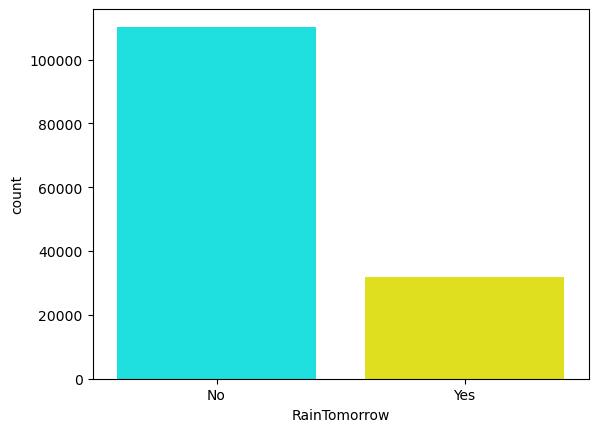

In [8]:
# Let's evaluate the target and find out if our data is imbalanced or not
sns.countplot(x= AUS_data["RainTomorrow"], palette= ['cyan','yellow'])

In [9]:
# Let's check the ratio of yes and no of our target variable
print("Percentage ratio of number of Yes's to No's: ",AUS_data[AUS_data.RainTomorrow == "Yes"]["RainTomorrow"].count()/AUS_data[AUS_data.RainTomorrow == "No"]["RainTomorrow"].count() * 100)

Percentage ratio of number of Yes's to No's:  28.8960803509917


We can consider it as a good spread / not imbalanced. There is no need of applying any of the imbalanced correction technique.

<h2 style="text-align:center;">Step 4: Data Preparation (handling missing values)</h2><a class="anchor" id="section-4"></a>

In [10]:
class DataOperations:
    """
    This class provides utility functions to work with our data.
    """
    def __init__(self, data, column):
        self.data = data
        self.column = column
        
    def is_null(self):
        # Returns True if the value in a column is null
        return self.data[self.column].isnull()
    
    def check_missing_values(self):
        # Check for missing values in the DataFrame
        missing_values = self.data[self.column].isnull().any()
        return missing_values
     
    def num_of_null_values(self):
        # Returns the number of null values in a column 
        return self.data[self.column].isnull().sum()
    
    def perc_of_null_values(self):
        # Returns the percentage of null values in a column
        return self.data[self.column].isnull().sum()/len(self.data[self.column])* 100
    
    def unique_values(self):
        # Returns the unique values in a column
        return self.data[self.column].unique()
    
    def value_counts(self):
        # Returns the value counts of all the unique values in a column
        return self.data[self.column].value_counts()

In [11]:
class PrintOperations(DataOperations):
    """
    This class prints out all the utility functions of DataOperations
    """
    def print_all_functions(self):
        print("Does {} have missing values? : {}".format(self.column, "Yes" if DataOperations(AUS_data, self.column).check_missing_values() else "No"))
        print("="*100)
        print("Number of null values of {}: {}".format(self.column, DataOperations(AUS_data, self.column).num_of_null_values()))
        print("="*100)
        print("Percentage of null values of {}: {}".format(self.column, DataOperations(AUS_data, self.column).perc_of_null_values()))
        print("="*100)
        print("Unique values in {}: {}".format(self.column, DataOperations(AUS_data, self.column).unique_values()))
        print("="*100)
        print("Count of unique values of {}: {}".format(self.column, DataOperations(AUS_data, self.column).value_counts()))

In [12]:
# Let's now display the number and percentage of null values in each column

num_of_null_values = pd.concat([pd.DataFrame(AUS_data.dtypes, columns=['Data Type']), pd.DataFrame(AUS_data.isnull().sum(), columns = ['Number of null values']),pd.DataFrame((AUS_data.isnull().sum()/len(AUS_data)*100), columns=["Percentage of missing values"])], axis = 'columns')
num_of_null_values

,Data Type,Number of null values,Percentage of missing values
Date,object,0,0.000000
Location,object,0,0.000000
MinTemp,float64,1485,1.020899
MaxTemp,float64,1261,0.866905
Rainfall,float64,3261,2.241853
Evaporation,float64,62790,43.166506
Sunshine,float64,69835,48.009762
WindGustDir,object,10326,7.098859
WindGustSpeed,float64,10263,7.055548
WindDir9am,object,10566,7.263853


We can see that for Evaporation, Sunshine, Cloud9am and Cloud3pm more than 40% values are missing.

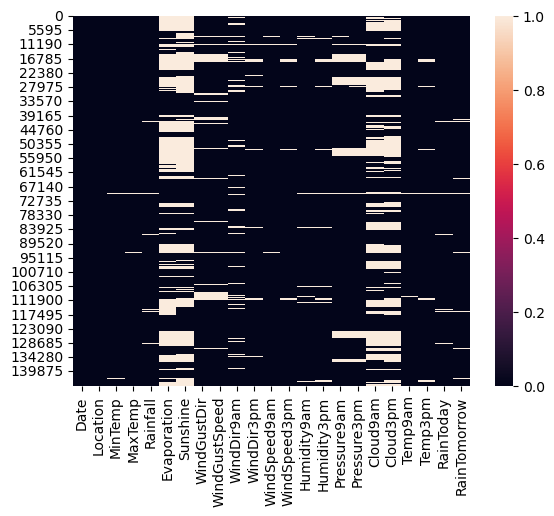

In [13]:
sns.heatmap(AUS_data.isnull());

In [14]:
AUS_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

#### There are wrong data types for some columns. Let's fix them.
Before that, let's split our columns based on their data type.

In [15]:
num_cols = AUS_data.select_dtypes(include="float64").columns
cat_cols = AUS_data.select_dtypes(include="object").columns

print("Numerical columns: {} \n Categorical columns : {}".format(num_cols, cat_cols))

Numerical columns: Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object') 
 Categorical columns : Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')


## <font color="blue">Categorical columns</font>

In [16]:
print(cat_cols)

Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')


#### 1. Date column

In [17]:
PrintOperations(AUS_data, "Date").print_all_functions()

Does Date have missing values? : No
Number of null values of Date: 0
Percentage of null values of Date: 0.0
Unique values in Date: ['2008-12-01' '2008-12-02' '2008-12-03' ... '2008-01-29' '2008-01-30'
 '2008-01-31']
Count of unique values of Date: 2013-11-12    49
2014-09-01    49
2014-08-23    49
2014-08-24    49
2014-08-25    49
              ..
2007-11-29     1
2007-11-28     1
2007-11-27     1
2007-11-26     1
2008-01-31     1
Name: Date, Length: 3436, dtype: int64


There are no null values in Date field

In [18]:
# Converting Date column to datetime
AUS_data['Date']= pd.to_datetime(AUS_data["Date"])
    
AUS_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           145460 non-null  datetime64[ns]
 1   Location       145460 non-null  object        
 2   MinTemp        143975 non-null  float64       
 3   MaxTemp        144199 non-null  float64       
 4   Rainfall       142199 non-null  float64       
 5   Evaporation    82670 non-null   float64       
 6   Sunshine       75625 non-null   float64       
 7   WindGustDir    135134 non-null  object        
 8   WindGustSpeed  135197 non-null  float64       
 9   WindDir9am     134894 non-null  object        
 10  WindDir3pm     141232 non-null  object        
 11  WindSpeed9am   143693 non-null  float64       
 12  WindSpeed3pm   142398 non-null  float64       
 13  Humidity9am    142806 non-null  float64       
 14  Humidity3pm    140953 non-null  float64       
 15  

Splitting a date column into its day, month, and year components enhances the ability to perform temporal analysis, facilitates feature engineering, and supports various data analysis and modeling tasks that involve temporal data. It is a common practice to gain a more comprehensive understanding of how time influences the dataset and its relationships.

In [19]:
# Splitting the Date column into Day, Month and Year
AUS_data["Day"] = AUS_data["Date"].dt.day
AUS_data["Month"] = AUS_data["Date"].dt.month
AUS_data["Year"] = AUS_data["Date"].dt.year

In [20]:
# Dropping the date column
AUS_data.drop("Date",axis=1,inplace=True)

In [21]:
AUS_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 25 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       145460 non-null  object 
 1   MinTemp        143975 non-null  float64
 2   MaxTemp        144199 non-null  float64
 3   Rainfall       142199 non-null  float64
 4   Evaporation    82670 non-null   float64
 5   Sunshine       75625 non-null   float64
 6   WindGustDir    135134 non-null  object 
 7   WindGustSpeed  135197 non-null  float64
 8   WindDir9am     134894 non-null  object 
 9   WindDir3pm     141232 non-null  object 
 10  WindSpeed9am   143693 non-null  float64
 11  WindSpeed3pm   142398 non-null  float64
 12  Humidity9am    142806 non-null  float64
 13  Humidity3pm    140953 non-null  float64
 14  Pressure9am    130395 non-null  float64
 15  Pressure3pm    130432 non-null  float64
 16  Cloud9am       89572 non-null   float64
 17  Cloud3pm       86102 non-null

#### 2. Location column

In [22]:
PrintOperations(AUS_data, "Location").print_all_functions()

Does Location have missing values? : No
Number of null values of Location: 0
Percentage of null values of Location: 0.0
Unique values in Location: ['Albury' 'BadgerysCreek' 'Cobar' 'CoffsHarbour' 'Moree' 'Newcastle'
 'NorahHead' 'NorfolkIsland' 'Penrith' 'Richmond' 'Sydney' 'SydneyAirport'
 'WaggaWagga' 'Williamtown' 'Wollongong' 'Canberra' 'Tuggeranong'
 'MountGinini' 'Ballarat' 'Bendigo' 'Sale' 'MelbourneAirport' 'Melbourne'
 'Mildura' 'Nhil' 'Portland' 'Watsonia' 'Dartmoor' 'Brisbane' 'Cairns'
 'GoldCoast' 'Townsville' 'Adelaide' 'MountGambier' 'Nuriootpa' 'Woomera'
 'Albany' 'Witchcliffe' 'PearceRAAF' 'PerthAirport' 'Perth' 'SalmonGums'
 'Walpole' 'Hobart' 'Launceston' 'AliceSprings' 'Darwin' 'Katherine'
 'Uluru']
Count of unique values of Location: Canberra            3436
Sydney              3344
Darwin              3193
Melbourne           3193
Brisbane            3193
Adelaide            3193
Perth               3193
Hobart              3193
Albany              3040
MountGambie

There are no null values in Location field

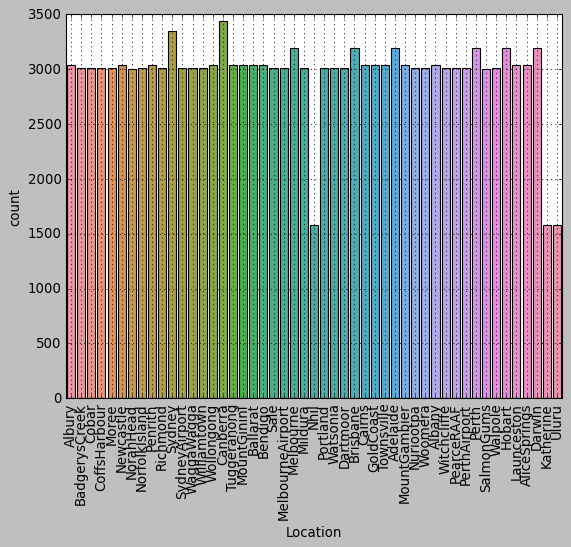

In [23]:
# Let's plot the location value count
plt.style.use("classic")
chart = sns.countplot(data=AUS_data, x="Location", orient='y')
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
plt.grid(linewidth = 0.7)
plt.show()

#### 3. WindGustDir column

In [24]:
PrintOperations(AUS_data, "WindGustDir").print_all_functions()

Does WindGustDir have missing values? : Yes
Number of null values of WindGustDir: 10326
Percentage of null values of WindGustDir: 7.098858792795271
Unique values in WindGustDir: ['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' nan 'ENE' 'SSE' 'S' 'NW' 'SE'
 'ESE' 'E' 'SSW']
Count of unique values of WindGustDir: W      9915
SE     9418
N      9313
SSE    9216
E      9181
S      9168
WSW    9069
SW     8967
SSW    8736
WNW    8252
NW     8122
ENE    8104
ESE    7372
NE     7133
NNW    6620
NNE    6548
Name: WindGustDir, dtype: int64


There are 10,326 missing values

Mode imputation is commonly used for categorical variables, where the concept of "average" or "mean" doesn't make sense. In categorical data, the mode represents the most frequently occurring category, which is a logical choice to replace missing values.

Imputing with the mode doesn't introduce bias into the data. It ensures that the imputed values are representative of the most common category, making it a neutral choice.

In [25]:
# Since the percentage of missing values is just 7%, we can impute the missing values with mode
AUS_data["WindGustDir"].fillna(AUS_data["WindGustDir"].mode()[0], inplace=True)

In [26]:
# Let's check if we imputed the missing values.
DataOperations(AUS_data, "WindGustDir").num_of_null_values()

0

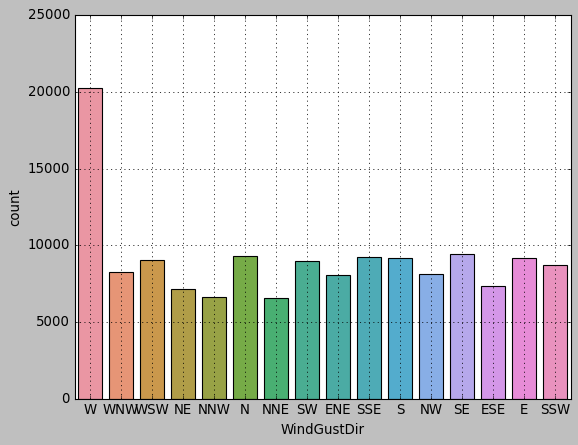

In [27]:
# Let's plot the WindGustDir value count
plt.style.use("classic")
sns.countplot(data=AUS_data, x="WindGustDir")
plt.grid(linewidth = 0.7)
plt.show()

#### 4. WindDir9am column

In [28]:
PrintOperations(AUS_data, "WindDir9am").print_all_functions()

Does WindDir9am have missing values? : Yes
Number of null values of WindDir9am: 10566
Percentage of null values of WindDir9am: 7.263852605527293
Unique values in WindDir9am: ['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' nan 'SSW' 'N' 'WSW' 'ESE' 'E'
 'NW' 'WNW' 'NNE']
Count of unique values of WindDir9am: N      11758
SE      9287
E       9176
SSE     9112
NW      8749
S       8659
W       8459
SW      8423
NNE     8129
NNW     7980
ENE     7836
NE      7671
ESE     7630
SSW     7587
WNW     7414
WSW     7024
Name: WindDir9am, dtype: int64


There are 10,566 missing values

Mode imputation is commonly used for categorical variables, where the concept of "average" or "mean" doesn't make sense. In categorical data, the mode represents the most frequently occurring category, which is a logical choice to replace missing values.

Imputing with the mode doesn't introduce bias into the data. It ensures that the imputed values are representative of the most common category, making it a neutral choice.

In [29]:
# Since the percentage of missing values is just 7%, we can impute the missing values with mode
AUS_data["WindDir9am"].fillna(AUS_data["WindDir9am"].mode()[0], inplace=True)

In [30]:
# Let's check if we imputed the missing values.
DataOperations(AUS_data, "WindDir9am").num_of_null_values()

0

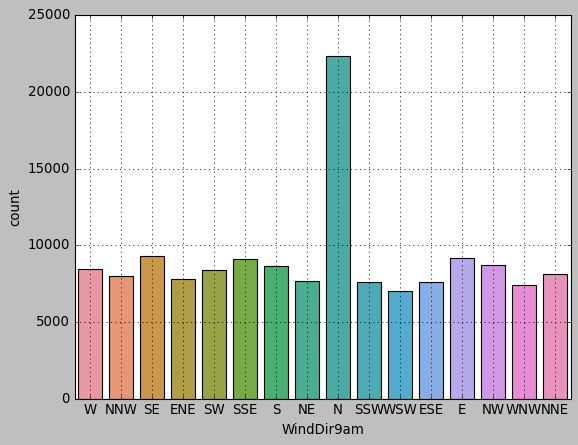

In [31]:
# Let's plot the WindGustDir value count
plt.style.use("classic")
sns.countplot(data=AUS_data, x="WindDir9am")
plt.grid(linewidth = 0.7)
plt.show()

#### 5. WindDir3pm column

In [32]:
PrintOperations(AUS_data, "WindDir3pm").print_all_functions()

Does WindDir3pm have missing values? : Yes
Number of null values of WindDir3pm: 4228
Percentage of null values of WindDir3pm: 2.906641000962464
Unique values in WindDir3pm: ['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW' 'SW' 'SE' 'N' 'S'
 'NNE' nan 'NE']
Count of unique values of WindDir3pm: SE     10838
W      10110
S       9926
WSW     9518
SSE     9399
SW      9354
N       8890
WNW     8874
NW      8610
ESE     8505
E       8472
NE      8263
SSW     8156
NNW     7870
ENE     7857
NNE     6590
Name: WindDir3pm, dtype: int64


There are 4,228 missing values

Mode imputation is commonly used for categorical variables, where the concept of "average" or "mean" doesn't make sense. In categorical data, the mode represents the most frequently occurring category, which is a logical choice to replace missing values.

Imputing with the mode doesn't introduce bias into the data. It ensures that the imputed values are representative of the most common category, making it a neutral choice.

In [33]:
# Since the percentage of missing values is just 3%, we can impute the missing values with mode
AUS_data["WindDir3pm"].fillna(AUS_data["WindDir3pm"].mode()[0], inplace=True)

In [34]:
# Let's check if we imputed the missing values.
DataOperations(AUS_data, "WindDir3pm").num_of_null_values()

0

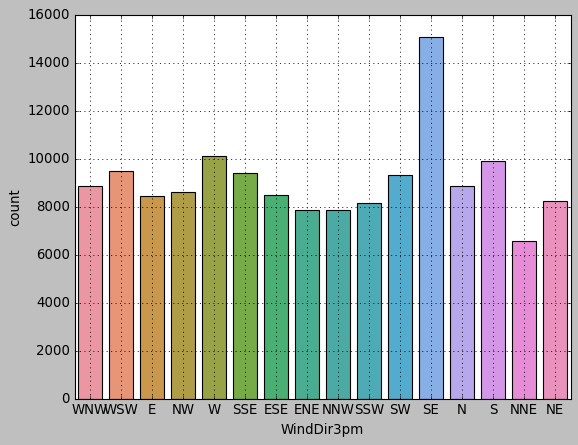

In [35]:
# Let's plot the WindDir3pm value count
plt.style.use("classic")
sns.countplot(data=AUS_data, x="WindDir3pm")
plt.grid(linewidth = 0.7)
plt.show()

#### 6. RainToday column

In [36]:
PrintOperations(AUS_data, "RainToday").print_all_functions()

Does RainToday have missing values? : Yes
Number of null values of RainToday: 3261
Percentage of null values of RainToday: 2.2418534304963567
Unique values in RainToday: ['No' 'Yes' nan]
Count of unique values of RainToday: No     110319
Yes     31880
Name: RainToday, dtype: int64


There are 3,261 missing values

Mode imputation is commonly used for categorical variables, where the concept of "average" or "mean" doesn't make sense. In categorical data, the mode represents the most frequently occurring category, which is a logical choice to replace missing values.

Imputing with the mode doesn't introduce bias into the data. It ensures that the imputed values are representative of the most common category, making it a neutral choice.

In [37]:
# Since the percentage of missing values is just 2%, we can impute the missing values with mode
AUS_data["RainToday"].fillna(AUS_data["RainToday"].mode()[0], inplace=True)

In [38]:
# Let's check if we imputed the missing values.
DataOperations(AUS_data, "RainToday").num_of_null_values()

0

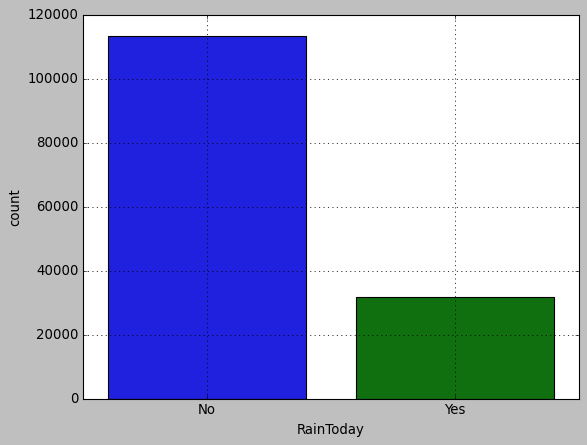

In [39]:
# Let's plot the RainToday value count
plt.style.use("classic")
sns.countplot(data=AUS_data, x="RainToday")
plt.grid(linewidth = 0.7)
plt.show()

#### 7. RainTomorrow column

In [40]:
PrintOperations(AUS_data, "RainTomorrow").print_all_functions()

Does RainTomorrow have missing values? : Yes
Number of null values of RainTomorrow: 3267
Percentage of null values of RainTomorrow: 2.245978275814657
Unique values in RainTomorrow: ['No' 'Yes' nan]
Count of unique values of RainTomorrow: No     110316
Yes     31877
Name: RainTomorrow, dtype: int64


There are 3,267 missing values

Mode imputation is commonly used for categorical variables, where the concept of "average" or "mean" doesn't make sense. In categorical data, the mode represents the most frequently occurring category, which is a logical choice to replace missing values.

Imputing with the mode doesn't introduce bias into the data. It ensures that the imputed values are representative of the most common category, making it a neutral choice.

In [41]:
# Since the percentage of missing values is just 2%, we can impute the missing values with mode
AUS_data["RainTomorrow"].fillna(AUS_data["RainTomorrow"].mode()[0], inplace=True)

In [42]:
# Let's check if we imputed the missing values.
DataOperations(AUS_data, "RainTomorrow").num_of_null_values()

0

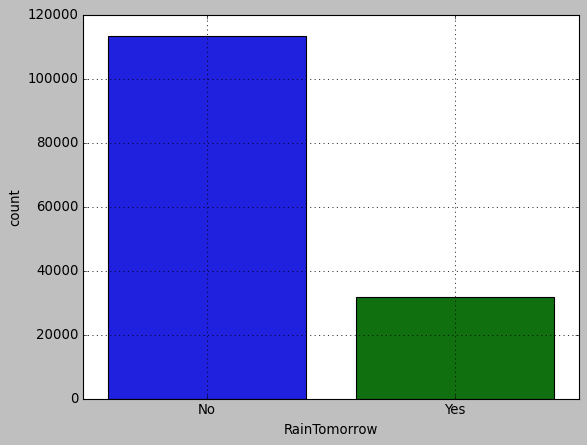

In [43]:
# Let's plot the RainTomorrow value count
plt.style.use("classic")
sns.countplot(data=AUS_data, x="RainTomorrow")
plt.grid(linewidth = 0.7)
plt.show()

## <font color="blue">Numerical columns</font>


In [44]:
print(num_cols)

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')


In [45]:
# Let's now display the number and percentage of null values in all the numerical columns

num_of_null_values = pd.concat([pd.DataFrame(AUS_data[num_cols].dtypes, columns=['Data Type']), pd.DataFrame(AUS_data[num_cols].isnull().sum(), columns = ['Number of null values']),pd.DataFrame((AUS_data[num_cols].isnull().sum()/len(AUS_data[num_cols])*100), columns=["Percentage of missing values"])], axis = 'columns')
num_of_null_values

,Data Type,Number of null values,Percentage of missing values
MinTemp,float64,1485,1.020899
MaxTemp,float64,1261,0.866905
Rainfall,float64,3261,2.241853
Evaporation,float64,62790,43.166506
Sunshine,float64,69835,48.009762
WindGustSpeed,float64,10263,7.055548
WindSpeed9am,float64,1767,1.214767
WindSpeed3pm,float64,3062,2.105046
Humidity9am,float64,2654,1.824557
Humidity3pm,float64,4507,3.098446


We can see that Sunshine and Evaporation have really high missing values(almost 50 %).
Sunshine is an important variable for our prediction here. We can either drop the column or impute the values with mean/median. Let's check the correlation first before coming to a conclusion.

In [46]:
AUS_data.corr()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
MinTemp,1.000000,0.736555,0.103938,0.466993,0.072586,0.177415,0.175064,0.175173,-0.232899,0.006089,-0.450970,-0.461292,0.078754,0.021605,0.901821,0.708906,0.002359,-0.203833,0.043263
MaxTemp,0.736555,1.000000,-0.074992,0.587932,0.470156,0.067615,0.014450,0.050300,-0.504110,-0.508855,-0.332061,-0.427167,-0.289370,-0.277921,0.887210,0.984503,0.000611,-0.163884,0.062044
Rainfall,0.103938,-0.074992,1.000000,-0.064351,-0.227549,0.133659,0.087338,0.057887,0.224405,0.255755,-0.168154,-0.126534,0.198528,0.172403,0.011192,-0.079657,0.001712,-0.031371,-0.008956
Evaporation,0.466993,0.587932,-0.064351,1.000000,0.365602,0.203021,0.193084,0.129400,-0.504092,-0.390243,-0.270362,-0.293581,-0.183793,-0.182618,0.545115,0.572893,-0.006051,-0.026805,0.084344
Sunshine,0.072586,0.470156,-0.227549,0.365602,1.000000,-0.034750,0.005499,0.053834,-0.490819,-0.629130,0.041970,-0.019719,-0.675323,-0.703930,0.291188,0.490501,-0.000397,0.024327,0.008788
WindGustSpeed,0.177415,0.067615,0.133659,0.203021,-0.034750,1.000000,0.605303,0.686307,-0.215070,-0.026327,-0.458744,-0.413749,0.071736,0.109168,0.150150,0.032748,-0.009063,0.061026,-0.030572
WindSpeed9am,0.175064,0.014450,0.087338,0.193084,0.005499,0.605303,1.000000,0.519547,-0.270858,-0.031614,-0.228743,-0.175817,0.025112,0.054639,0.128545,0.004569,-0.008786,0.051277,-0.018440
WindSpeed3pm,0.175173,0.050300,0.057887,0.129400,0.053834,0.686307,0.519547,1.000000,-0.145525,0.016432,-0.296351,-0.255439,0.053337,0.025396,0.163030,0.027778,-0.009943,0.060373,-0.029775
Humidity9am,-0.232899,-0.504110,0.224405,-0.504092,-0.490819,-0.215070,-0.270858,-0.145525,1.000000,0.666949,0.139442,0.186858,0.452297,0.357326,-0.471354,-0.498399,0.015166,-0.090759,0.009846
Humidity3pm,0.006089,-0.508855,0.255755,-0.390243,-0.629130,-0.026327,-0.031614,0.016432,0.666949,1.000000,-0.027544,0.051997,0.517120,0.523120,-0.221019,-0.557841,0.013013,-0.018858,-0.009662


MaxTemp and MinTemp have a high positive correlation of approximately 0.737. This suggests that as the maximum temperature (MaxTemp) increases, the minimum temperature (MinTemp) also tends to increase.

MaxTemp and Sunshine have a positive correlation of approximately 0.470. This indicates that higher maximum temperatures are associated with more sunshine.

Pressure9am and Pressure3pm features are highly correlated (correlation coefficient = 0.96).

There is a huge negative correlation between Sunshine and Cloud9am, Cloud3pm. The more clouds there are the less sunshine it has. I think dropping Cloud9am and Cloud3pm might not effect the prediction as much.

In [47]:
# Precentage of missing values in the features Cloud9am is 38% and Cloud3pm is 40%. 
# Since they also have high correlation with Sunshine, it is okay to drop these variables.

AUS_data.drop(['Cloud9am','Cloud3pm'], axis = 1, inplace = True)

In [48]:
# Evaporation has high correlation with MinTemp, MaxTemp, Humidity9am and Temp9am and Temp3pm and also has 43 % missing values.
# This column impacts our prediction negatively, so it is better to drop it.
AUS_data.drop('Evaporation', axis=1, inplace=True)

In [49]:
AUS_data.corr()

,MinTemp,MaxTemp,Rainfall,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,Day,Month,Year
MinTemp,1.000000,0.736555,0.103938,0.072586,0.177415,0.175064,0.175173,-0.232899,0.006089,-0.450970,-0.461292,0.901821,0.708906,0.002359,-0.203833,0.043263
MaxTemp,0.736555,1.000000,-0.074992,0.470156,0.067615,0.014450,0.050300,-0.504110,-0.508855,-0.332061,-0.427167,0.887210,0.984503,0.000611,-0.163884,0.062044
Rainfall,0.103938,-0.074992,1.000000,-0.227549,0.133659,0.087338,0.057887,0.224405,0.255755,-0.168154,-0.126534,0.011192,-0.079657,0.001712,-0.031371,-0.008956
Sunshine,0.072586,0.470156,-0.227549,1.000000,-0.034750,0.005499,0.053834,-0.490819,-0.629130,0.041970,-0.019719,0.291188,0.490501,-0.000397,0.024327,0.008788
WindGustSpeed,0.177415,0.067615,0.133659,-0.034750,1.000000,0.605303,0.686307,-0.215070,-0.026327,-0.458744,-0.413749,0.150150,0.032748,-0.009063,0.061026,-0.030572
WindSpeed9am,0.175064,0.014450,0.087338,0.005499,0.605303,1.000000,0.519547,-0.270858,-0.031614,-0.228743,-0.175817,0.128545,0.004569,-0.008786,0.051277,-0.018440
WindSpeed3pm,0.175173,0.050300,0.057887,0.053834,0.686307,0.519547,1.000000,-0.145525,0.016432,-0.296351,-0.255439,0.163030,0.027778,-0.009943,0.060373,-0.029775
Humidity9am,-0.232899,-0.504110,0.224405,-0.490819,-0.215070,-0.270858,-0.145525,1.000000,0.666949,0.139442,0.186858,-0.471354,-0.498399,0.015166,-0.090759,0.009846
Humidity3pm,0.006089,-0.508855,0.255755,-0.629130,-0.026327,-0.031614,0.016432,0.666949,1.000000,-0.027544,0.051997,-0.221019,-0.557841,0.013013,-0.018858,-0.009662
Pressure9am,-0.450970,-0.332061,-0.168154,0.041970,-0.458744,-0.228743,-0.296351,0.139442,-0.027544,1.000000,0.961326,-0.422556,-0.286770,-0.021423,0.034928,0.030123


In [50]:
# Temp9am and Temp3pm also have really high correlation with MaxTemp and MinTemp. Let's drop these columns
AUS_data.drop(['Temp9am','Temp3pm'], axis = 1, inplace = True)
AUS_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 20 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       145460 non-null  object 
 1   MinTemp        143975 non-null  float64
 2   MaxTemp        144199 non-null  float64
 3   Rainfall       142199 non-null  float64
 4   Sunshine       75625 non-null   float64
 5   WindGustDir    145460 non-null  object 
 6   WindGustSpeed  135197 non-null  float64
 7   WindDir9am     145460 non-null  object 
 8   WindDir3pm     145460 non-null  object 
 9   WindSpeed9am   143693 non-null  float64
 10  WindSpeed3pm   142398 non-null  float64
 11  Humidity9am    142806 non-null  float64
 12  Humidity3pm    140953 non-null  float64
 13  Pressure9am    130395 non-null  float64
 14  Pressure3pm    130432 non-null  float64
 15  RainToday      145460 non-null  object 
 16  RainTomorrow   145460 non-null  object 
 17  Day            145460 non-nul

In [51]:
# Let's now display the number and percentage of null values in all the numerical columns
num_cols = AUS_data.select_dtypes(include="float64").columns
num_of_null_values = pd.concat([pd.DataFrame(AUS_data[num_cols].dtypes, columns=['Data Type']), pd.DataFrame(AUS_data[num_cols].isnull().sum(), columns = ['Number of null values']),pd.DataFrame((AUS_data[num_cols].isnull().sum()/len(AUS_data[num_cols])*100), columns=["Percentage of missing values"])], axis = 'columns')
num_of_null_values

,Data Type,Number of null values,Percentage of missing values
MinTemp,float64,1485,1.020899
MaxTemp,float64,1261,0.866905
Rainfall,float64,3261,2.241853
Sunshine,float64,69835,48.009762
WindGustSpeed,float64,10263,7.055548
WindSpeed9am,float64,1767,1.214767
WindSpeed3pm,float64,3062,2.105046
Humidity9am,float64,2654,1.824557
Humidity3pm,float64,4507,3.098446
Pressure9am,float64,15065,10.356799


### Sunshine column

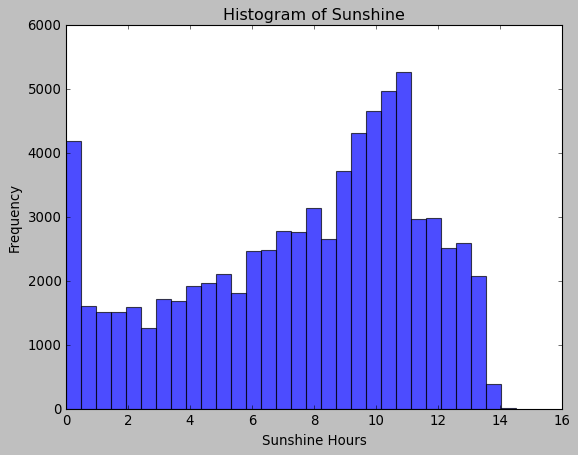

In [52]:
# Let's plot the non-missing data to see the distribution of Sunshine
sunshine_data = AUS_data['Sunshine'].dropna()

# Create a histogram
plt.hist(sunshine_data, bins=30, color='blue', alpha=0.7)
plt.title('Histogram of Sunshine')
plt.xlabel('Sunshine Hours')
plt.ylabel('Frequency')
plt.show()

In [53]:
from scipy.stats import shapiro

# Assuming 'sunshine_data' is the non-missing data from the 'Sunshine' variable
shapiro_stat, p_value = shapiro(sunshine_data)

if p_value > 0.05:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

The data does not appear to be normally distributed.


The data is skewed or has a non-normal distribution. The median is robust to outliers and less influenced by extreme values. So, let's impute Sunshine with median.


Text(0, 0.5, 'RainTomorrow')

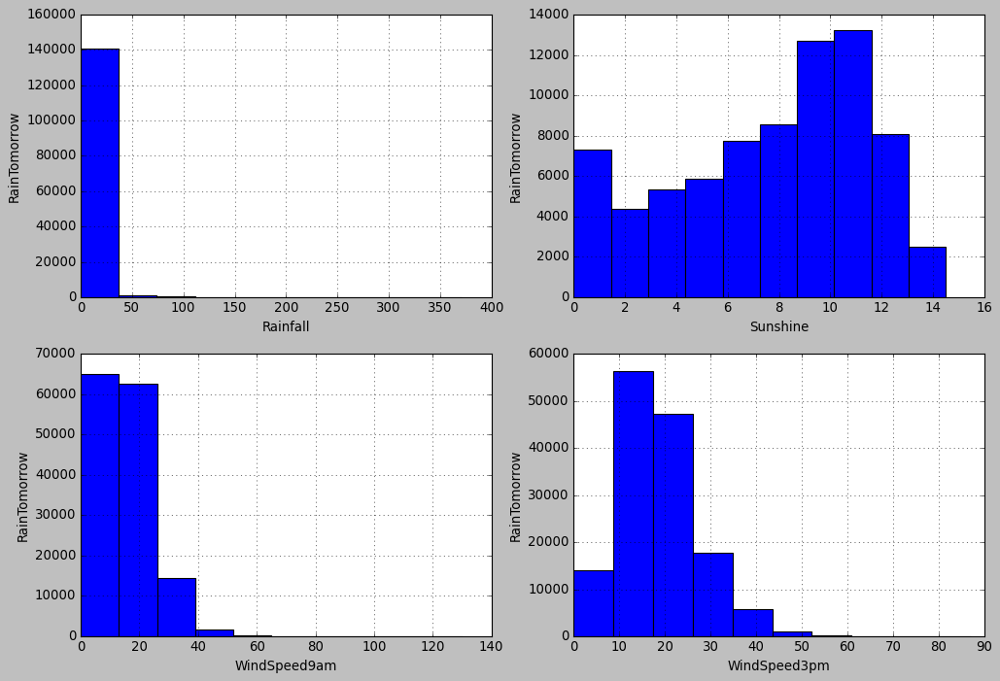

In [54]:
# plot histogram to check distribution

plt.figure(figsize=(15,10))


plt.subplot(2, 2, 1)
fig = AUS_data.Rainfall.hist(bins=10)
fig.set_xlabel('Rainfall')
fig.set_ylabel('RainTomorrow')


plt.subplot(2, 2, 2)
fig = AUS_data.Sunshine.hist(bins=10)
fig.set_xlabel('Sunshine')
fig.set_ylabel('RainTomorrow')


plt.subplot(2, 2, 3)
fig = AUS_data.WindSpeed9am.hist(bins=10)
fig.set_xlabel('WindSpeed9am')
fig.set_ylabel('RainTomorrow')


plt.subplot(2, 2, 4)
fig = AUS_data.WindSpeed3pm.hist(bins=10)
fig.set_xlabel('WindSpeed3pm')
fig.set_ylabel('RainTomorrow')

We can see that all the four variables are skewed.

Assumption:

I assume that the data are missing completely at random (MCAR). There are two methods which can be used to impute missing values. One is mean or median imputation and other one is random sample imputation. When there are outliers in the dataset, we should use median imputation. So, I will use median imputation because median imputation is robust to outliers.

In [55]:
# Filling in the missing values of all numerical columns
for i in AUS_data:
    if AUS_data[i].dtype=='float64':
        AUS_data[i].replace(to_replace=np.nan, value=AUS_data[i].median(), inplace=True)
    else:
        continue

In [56]:
# Let's now display the number and percentage of null values in all the numerical columns
num_cols = AUS_data.select_dtypes(include="float64").columns
num_of_null_values = pd.concat([pd.DataFrame(AUS_data[num_cols].dtypes, columns=['Data Type']), pd.DataFrame(AUS_data[num_cols].isnull().sum(), columns = ['Number of null values']),pd.DataFrame((AUS_data[num_cols].isnull().sum()/len(AUS_data[num_cols])*100), columns=["Percentage of missing values"])], axis = 'columns')
num_of_null_values 

,Data Type,Number of null values,Percentage of missing values
MinTemp,float64,0,0.0
MaxTemp,float64,0,0.0
Rainfall,float64,0,0.0
Sunshine,float64,0,0.0
WindGustSpeed,float64,0,0.0
WindSpeed9am,float64,0,0.0
WindSpeed3pm,float64,0,0.0
Humidity9am,float64,0,0.0
Humidity3pm,float64,0,0.0
Pressure9am,float64,0,0.0


<h2 style="text-align:center;">Step 5: Data Visualization</h2><a class="anchor" id="section-5"></a>

## 1. Plotting Categorical columns

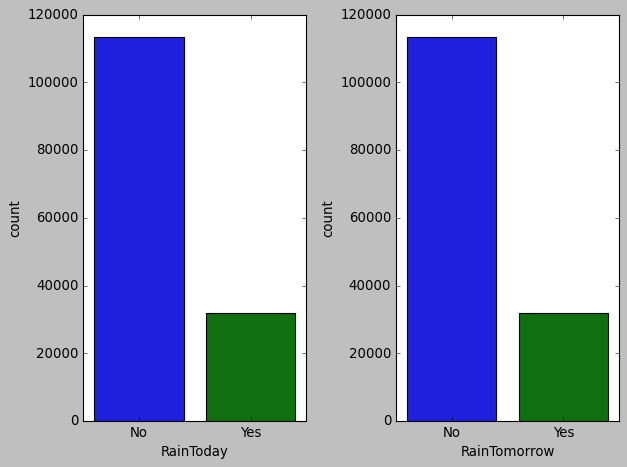

<Figure size 1600x1600 with 0 Axes>

In [57]:
fig, ax =plt.subplots(1,2)
plt.figure(figsize=(20,20))
sns.countplot(data=AUS_data,x='RainToday',ax=ax[0])
sns.countplot(data=AUS_data,x='RainTomorrow',ax=ax[1])
fig.tight_layout()

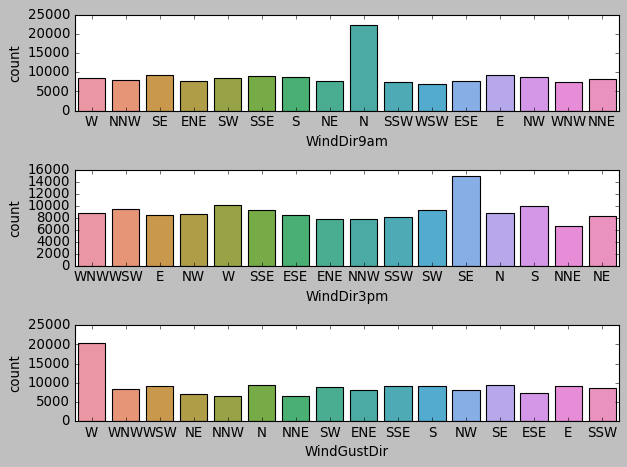

<Figure size 800x800 with 0 Axes>

In [58]:
fig, ax =plt.subplots(3,1)
plt.figure(figsize=(10,10))

sns.countplot(data=AUS_data,x='WindDir9am',ax=ax[0])
sns.countplot(data=AUS_data,x='WindDir3pm',ax=ax[1])
sns.countplot(data=AUS_data,x='WindGustDir',ax=ax[2])
fig.tight_layout()

WindDirection at 9am is highest towards N.

WindDirection at 3pm is highest towards SE.

In [59]:
# For example, let's show the distribution of RainTomorrow depending on the localization
fig=px.histogram(AUS_data, 
                 x="RainTomorrow",
                 color="Location",
                 hover_data=AUS_data.columns,
                 title="Distribution of RainTomorrow Distribution by Location",
                 barmode="group",
                )
fig.show()

## 2. Plotting Continuous variables

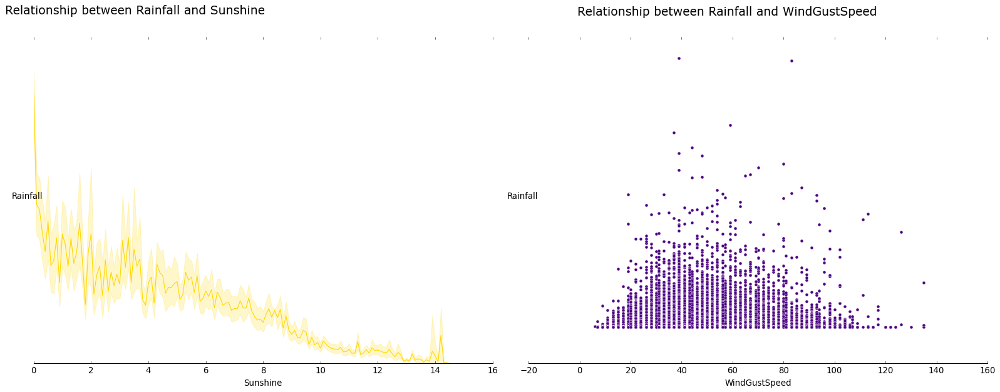

In [60]:
# Let's look at the relationship between Rainfall and Sunshine, Rainfall and WindGustSpeed
fig=plt.figure(figsize=(20,8),facecolor='white')

gs=fig.add_gridspec(1,2)

ax=[_ for _ in range(2)]
ax[0]=fig.add_subplot(gs[0,0])
ax[1]=fig.add_subplot(gs[0,1])

ax[0].text(-1,15,"Relationship between Rainfall and Sunshine",fontsize=17,fontweight='normal', fontfamily='Verdana')

ax[1].text(-1,430,"Relationship between Rainfall and WindGustSpeed",fontsize=17,fontweight='normal', fontfamily='Verdana')

sns.lineplot(data=AUS_data,x='Sunshine',y='Rainfall',ax=ax[0],color='#FFD700')
sns.scatterplot(data=AUS_data,x='WindGustSpeed',y='Rainfall',ax=ax[1],color='#4B0082')

for i in range(2):
    
    ax[i].set_ylabel('Rainfall').set_rotation(0)
    ax[i].set_yticklabels('')
    ax[i].tick_params(axis='y',length=0)
    
    for direction in ['top','right','left']:
        ax[i].spines[direction].set_visible(False)
        
plt.tight_layout()
plt.show()

Rainfall is iversely proportional to Sunshine

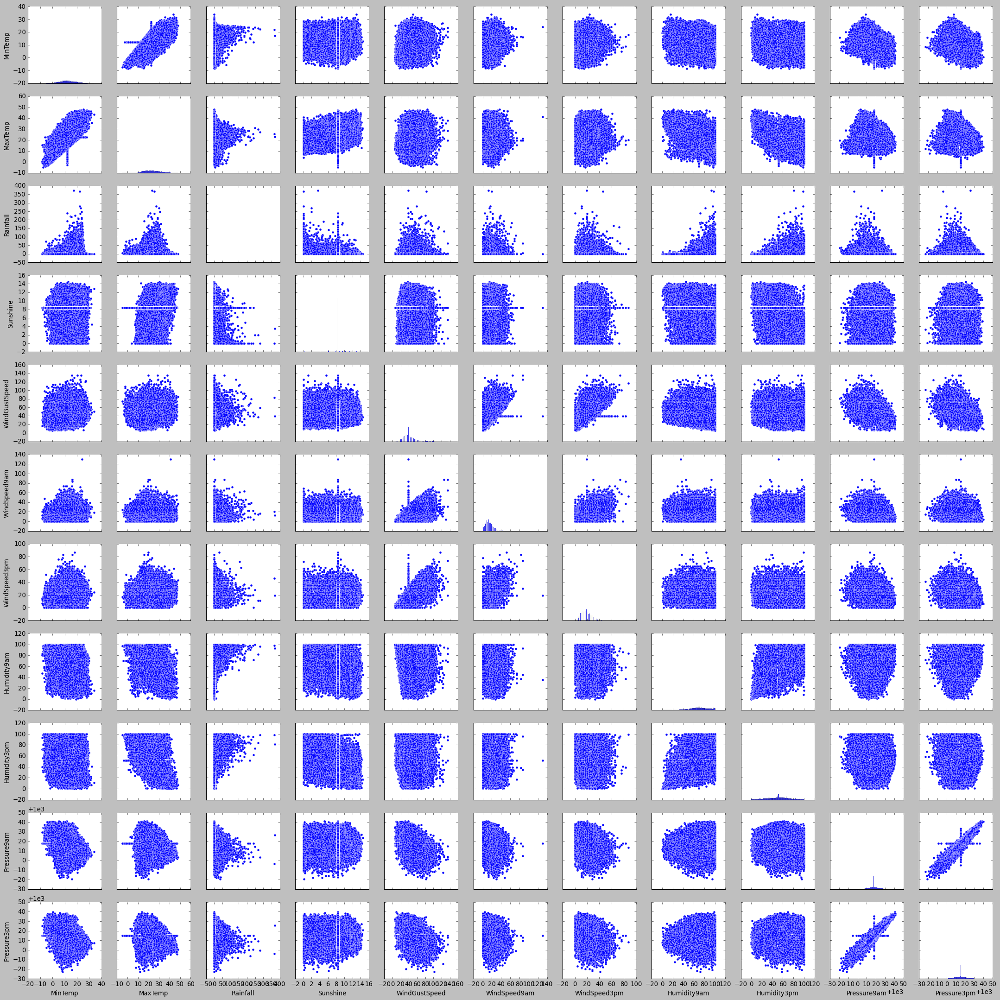

In [61]:
sns.pairplot(AUS_data[num_cols], kind='scatter', diag_kind='hist', palette='Rainbow')
plt.show()

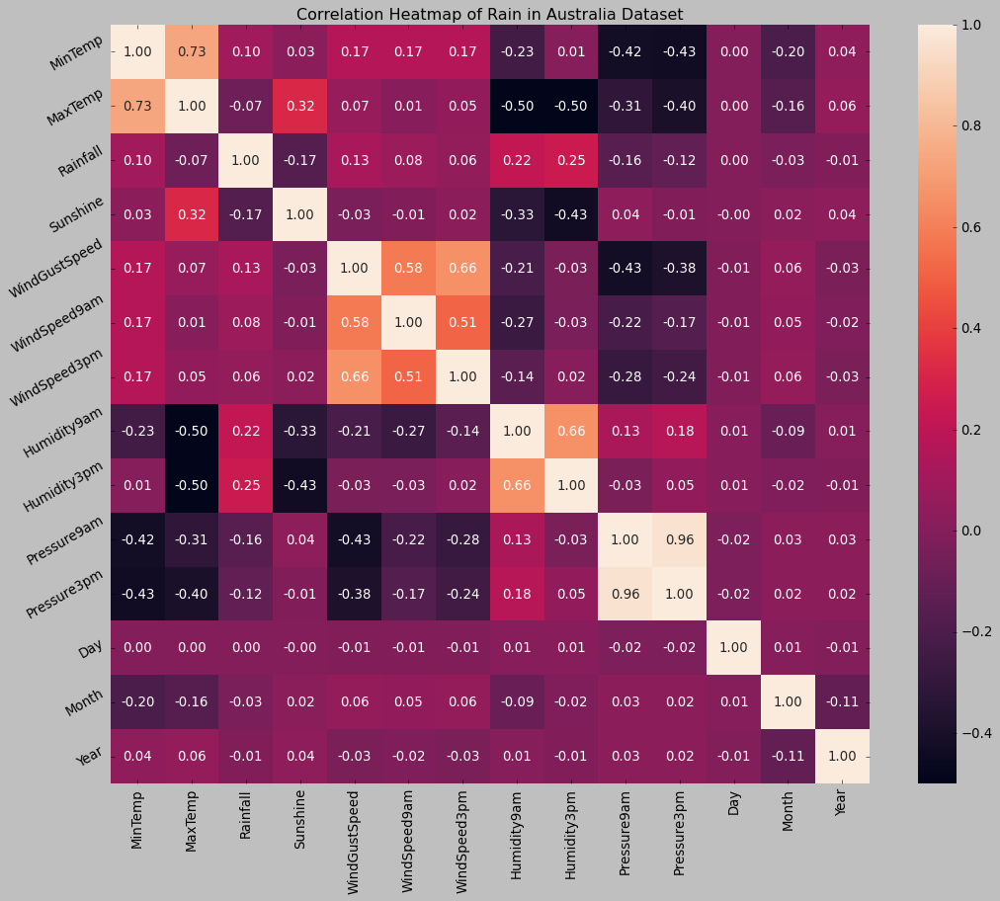

In [62]:
plt.figure(figsize=(16,12))
plt.title('Correlation Heatmap of Rain in Australia Dataset')
ax = sns.heatmap(AUS_data.corr(), square=True, annot=True, fmt='.2f', linecolor='white')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_yticklabels(ax.get_yticklabels(), rotation=30)           
plt.show()

Pressure9am and Pressure3pm variables are strongly positively correlated (correlation coefficient = 0.96).

<h2 style="text-align:center;">Step 6: Data Preprocessing</h2><a class="anchor" id="section-6"></a>

## 1. Label Encoding Categorical columns

In [63]:
# Apply label encoder to each column with categorical data
cat_cols = AUS_data.select_dtypes(include="object").columns
label_encoder = LabelEncoder()
for i in cat_cols:
    AUS_data[i] = label_encoder.fit_transform(AUS_data[i])
    
AUS_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 20 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       145460 non-null  int64  
 1   MinTemp        145460 non-null  float64
 2   MaxTemp        145460 non-null  float64
 3   Rainfall       145460 non-null  float64
 4   Sunshine       145460 non-null  float64
 5   WindGustDir    145460 non-null  int64  
 6   WindGustSpeed  145460 non-null  float64
 7   WindDir9am     145460 non-null  int64  
 8   WindDir3pm     145460 non-null  int64  
 9   WindSpeed9am   145460 non-null  float64
 10  WindSpeed3pm   145460 non-null  float64
 11  Humidity9am    145460 non-null  float64
 12  Humidity3pm    145460 non-null  float64
 13  Pressure9am    145460 non-null  float64
 14  Pressure3pm    145460 non-null  float64
 15  RainToday      145460 non-null  int64  
 16  RainTomorrow   145460 non-null  int64  
 17  Day            145460 non-nul

If you have a categorical feature with only a few distinct categories, label encoding may be a convenient choice. It simplifies the data representation without introducing excessive dimensionality.

In [64]:
AUS_data.head()

,Location,MinTemp,MaxTemp,Rainfall,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,RainToday,RainTomorrow,Day,Month,Year
0,2,13.4,22.9,0.6,8.4,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,0,0,1,12,2008
1,2,7.4,25.1,0.0,8.4,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,0,0,2,12,2008
2,2,12.9,25.7,0.0,8.4,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,0,0,3,12,2008
3,2,9.2,28.0,0.0,8.4,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,0,0,4,12,2008
4,2,17.5,32.3,1.0,8.4,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,0,0,5,12,2008


## 2.  Scaling of the numerical columns

### Detecting Outliers and dropping the outliers based on data analysis

Text(0, 0.5, 'WindSpeed3pm')

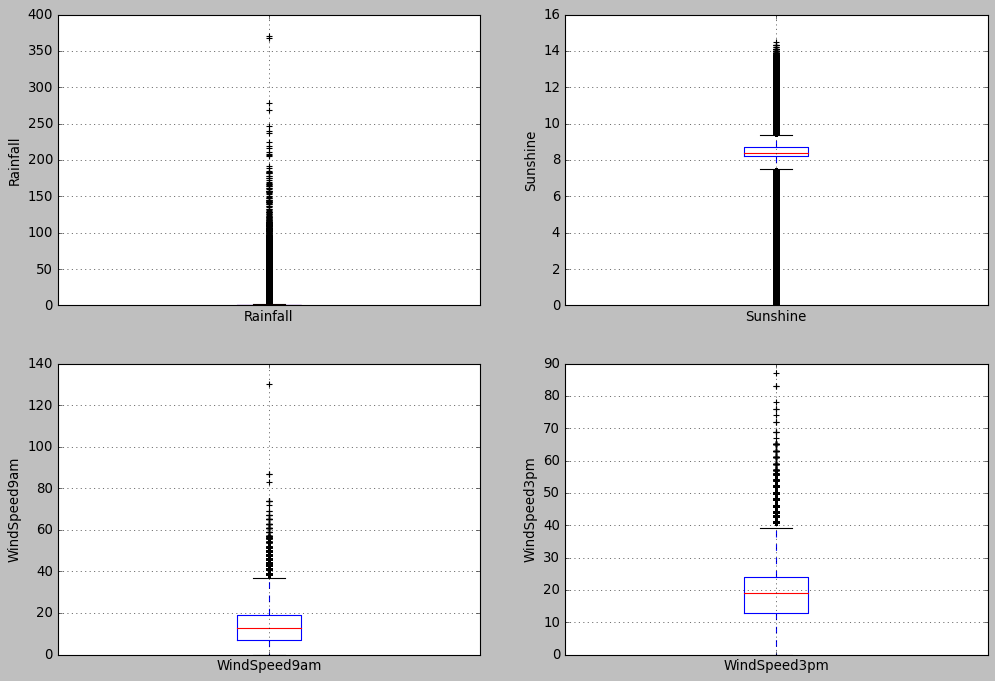

In [65]:
# draw boxplots to visualize outliers

plt.figure(figsize=(15,10))


plt.subplot(2, 2, 1)
fig = AUS_data.boxplot(column='Rainfall')
fig.set_title('')
fig.set_ylabel('Rainfall')


plt.subplot(2, 2, 2)
fig = AUS_data.boxplot(column='Sunshine')
fig.set_title('')
fig.set_ylabel('Sunshine')


plt.subplot(2, 2, 3)
fig = AUS_data.boxplot(column='WindSpeed9am')
fig.set_title('')
fig.set_ylabel('WindSpeed9am')


plt.subplot(2, 2, 4)
fig = AUS_data.boxplot(column='WindSpeed3pm')
fig.set_title('')
fig.set_ylabel('WindSpeed3pm')

The above boxplots confirm that there are lot of outliers in these variables.

Let's plot the histograms to check distributions to find out if they are normal or skewed.

Text(0, 0.5, 'RainTomorrow')

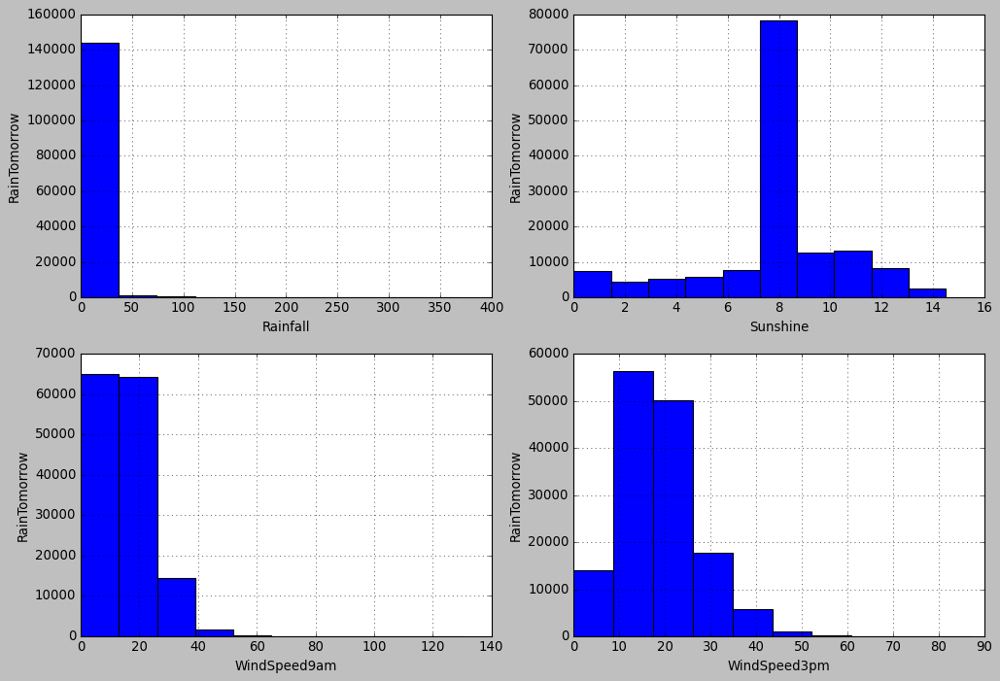

In [66]:
# plot histogram to check distribution

plt.figure(figsize=(15,10))

plt.subplot(2, 2, 1)
fig = AUS_data.Rainfall.hist(bins=10)
fig.set_xlabel('Rainfall')
fig.set_ylabel('RainTomorrow')


plt.subplot(2, 2, 2)
fig = AUS_data.Sunshine.hist(bins=10)
fig.set_xlabel('Sunshine')
fig.set_ylabel('RainTomorrow')


plt.subplot(2, 2, 3)
fig = AUS_data.WindSpeed9am.hist(bins=10)
fig.set_xlabel('WindSpeed9am')
fig.set_ylabel('RainTomorrow')


plt.subplot(2, 2, 4)
fig = AUS_data.WindSpeed3pm.hist(bins=10)
fig.set_xlabel('WindSpeed3pm')
fig.set_ylabel('RainTomorrow')

We can see that all the four variables are skewed.

StandardScaler is robust to outliers because it is based on the mean and standard deviation, which are not sensitive to extreme values. This makes it a good choice for datasets with outliers

In [67]:
# Prepairing attributes of scale data

features = AUS_data.drop('RainTomorrow', axis=1) # dropping target column

target = AUS_data['RainTomorrow']

#Set up a standard scaler for the features
col_names = list(features.columns)
s_scaler = preprocessing.StandardScaler()
features = s_scaler.fit_transform(features)
features = pd.DataFrame(features, columns=col_names) 

features.describe().T

,count,mean,std,min,25%,50%,75%,max
Location,145460.0,7.815677e-18,1.000003,-1.672228,-0.899139,0.014511,0.857881,1.701250
MinTemp,145460.0,-4.501830e-16,1.000003,-3.250525,-0.705659,-0.030170,0.723865,3.410112
MaxTemp,145460.0,3.001220e-16,1.000003,-3.952405,-0.735852,-0.086898,0.703133,3.510563
Rainfall,145460.0,7.815677e-18,1.000003,-0.275097,-0.275097,-0.275097,-0.203581,43.945571
Sunshine,145460.0,-5.424080e-16,1.000003,-2.897217,0.076188,0.148710,0.257494,2.360634
WindGustDir,145460.0,6.252542e-18,1.000003,-1.724209,-0.872075,0.193094,1.045228,1.471296
WindGustSpeed,145460.0,1.824961e-16,1.000003,-2.588407,-0.683048,-0.073333,0.460168,7.243246
WindDir9am,145460.0,7.190423e-17,1.000003,-1.550000,-0.885669,0.000105,0.885879,1.771653
WindDir3pm,145460.0,8.284618e-17,1.000003,-1.718521,-0.837098,0.044324,0.925747,1.586813
WindSpeed9am,145460.0,5.627287e-17,1.000003,-1.583291,-0.793380,-0.116314,0.560752,13.086472


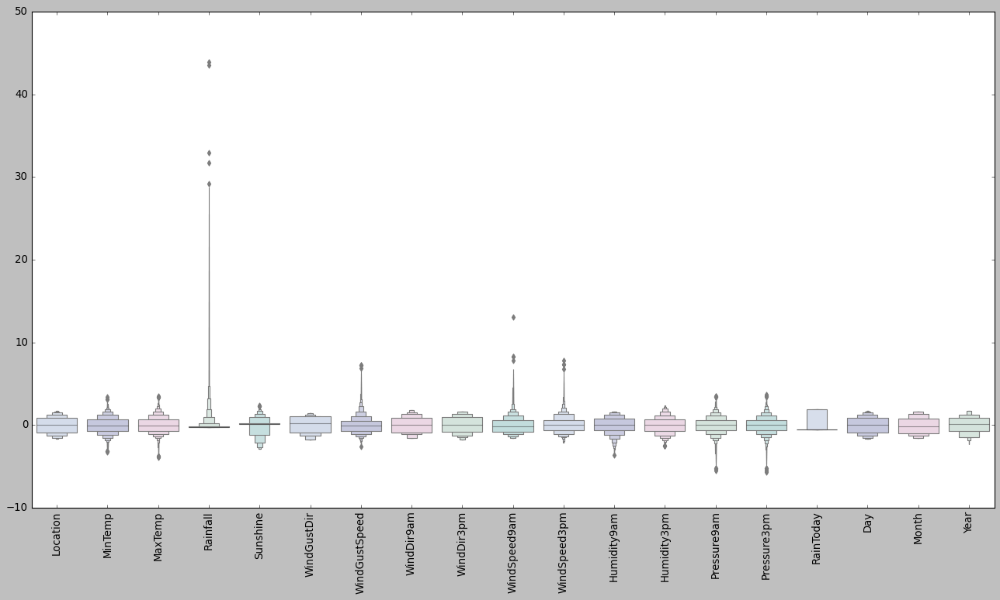

In [68]:
# Detecting outliers
colours = ["#D0DBEE", "#C2C4E2", "#EED4E5", "#D1E6DC", "#BDE2E2"]
plt.figure(figsize=(20,10))
sns.boxenplot(data = features,palette = colours)
plt.xticks(rotation=90)
plt.show()

In [69]:
features.shape

(145460, 19)

In [70]:
#Dropping the outliers
features["RainTomorrow"] = target

features = features[(features["MinTemp"]<2.3)&(features["MinTemp"]>-2.3)]
features = features[(features["MaxTemp"]<2.3)&(features["MaxTemp"]>-2)]
features = features[(features["Rainfall"]<4.5)]
features = features[(features["Sunshine"]<2.1)]
features = features[(features["WindGustSpeed"]<4)&(features["WindGustSpeed"]>-4)]
features = features[(features["WindSpeed9am"]<4)]
features = features[(features["WindSpeed3pm"]<2.5)]
features = features[(features["Humidity9am"]>-3)]
features = features[(features["Humidity3pm"]>-2.2)]
features = features[(features["Pressure9am"]< 2)&(features["Pressure9am"]>-2.7)]
features = features[(features["Pressure3pm"]< 2)&(features["Pressure3pm"]>-2.7)]

features.shape

(130981, 20)

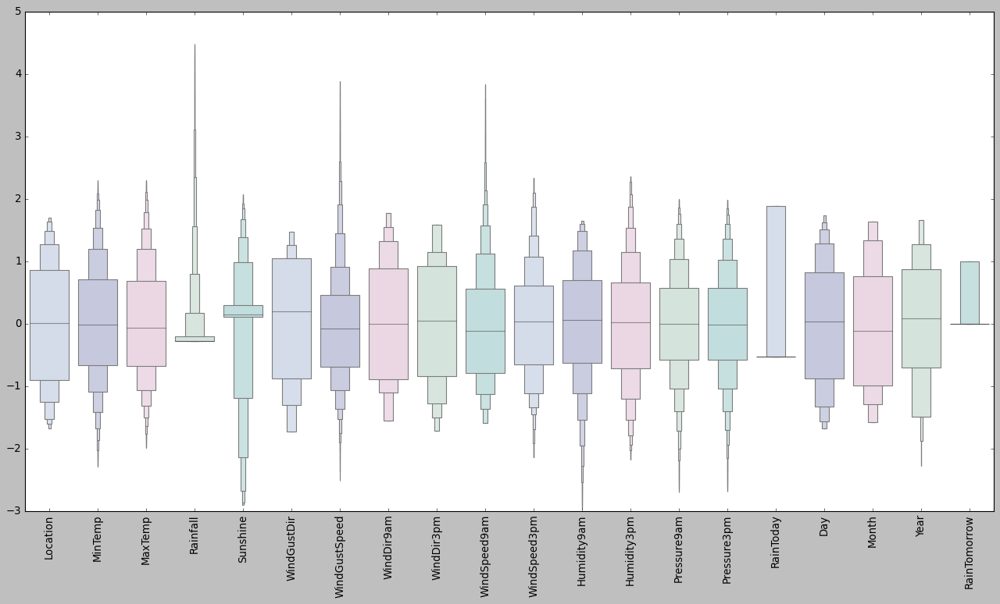

In [71]:
# Let's now check the plots

plt.figure(figsize=(20,10))
sns.boxenplot(data = features,palette = colours)
plt.xticks(rotation=90)
plt.show()

The plot looks good now.

<h2 style="text-align:center;">Step 7: Model Building</h2> <a class="anchor" id="section-7"></a>

I have not put much emphasis on this section. This is just to test my model.

In [72]:
X = features.drop(["RainTomorrow"], axis=1)
y = features["RainTomorrow"]

# Splitting test and training sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

X.shape

(130981, 19)

In [73]:
# Training a logistic regression model on the training set
# instantiate the model
logreg = LogisticRegression(solver='liblinear', random_state=0)


# Fit the model
logreg.fit(X_train, y_train)

LogisticRegression(random_state=0, solver='liblinear')

In [74]:
y_pred_test = logreg.predict(X_test)
y_pred_train = logreg.predict(X_train)

In [75]:
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred_test)))

Model accuracy score: 0.8438


In [76]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(logreg.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(logreg.score(X_test, y_test)))

Training set score: 0.8441
Test set score: 0.8438


The training-set accuracy score is 0.8441 while the test-set accuracy to be 0.8438. These two values are quite comparable. So, there is no question of overfitting.



In [77]:
# check class distribution in test set

y_test.value_counts()

0    20576
1     5621
Name: RainTomorrow, dtype: int64

<Axes: >

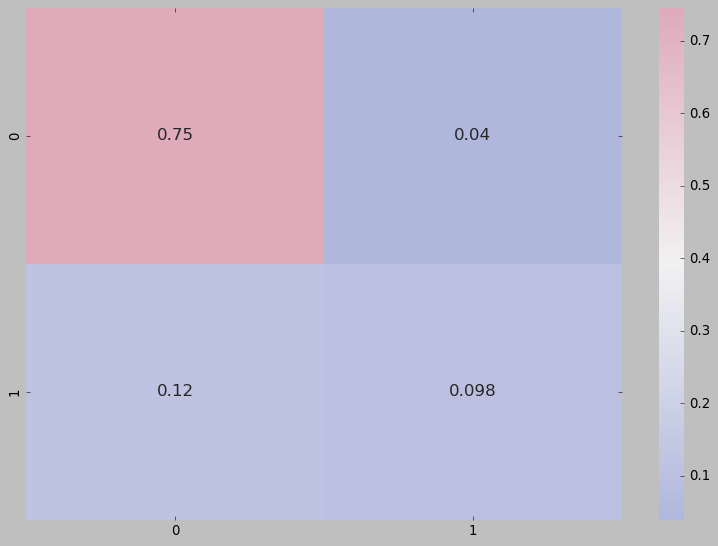

In [78]:
# Confusion matrix
cmap1 = sns.diverging_palette(260,-10,s=50, l=75, n=5, as_cmap=True)
plt.subplots(figsize=(12,8))
cf_matrix = confusion_matrix(y_test, y_pred_test)
sns.heatmap(cf_matrix/np.sum(cf_matrix), cmap = cmap1, annot = True, annot_kws = {'size':15})

In [79]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.86      0.95      0.91     20576
           1       0.71      0.46      0.56      5621

    accuracy                           0.84     26197
   macro avg       0.79      0.70      0.73     26197
weighted avg       0.83      0.84      0.83     26197



The classification contains performance metrics for a binary classification model with two classes, labeled as "0" and "1." 

Here's an interpretation of the metrics:

Precision (for class 0): Precision for class 0 is 0.86. This means that, of all the instances predicted as class 0, 86% were correctly classified as class 0.

Recall (for class 0): Recall for class 0 is 0.95. This indicates that the model was able to correctly identify 95% of all the actual instances of class 0.

F1-Score (for class 0): The F1-score for class 0 is 0.91. The F1-score is the harmonic mean of precision and recall. An F1-score of 0.91 is a good balance between precision and recall for class 0.

Support (for class 0): The support for class 0 is 20,576, meaning that there are 20,576 instances in the dataset that belong to class 0.

Precision (for class 1): Precision for class 1 is 0.71. This indicates that, of all the instances predicted as class 1, 71% were correctly classified as class 1.

Recall (for class 1): Recall for class 1 is 0.46. This means that the model was able to correctly identify 46% of all the actual instances of class 1.

F1-Score (for class 1): The F1-score for class 1 is 0.56. An F1-score of 0.56 is a moderate balance between precision and recall for class 1.

Support (for class 1): The support for class 1 is 5,621, indicating that there are 5,621 instances in the dataset that belong to class 1.